##### Installer et importer toutes les bibliothèques dont nous avons besoin
- pip install pillow
- pip install opencv-python
- pip install pytesseract

In [1]:
#__________MODULES
import pytesseract
from PIL import Image
import cv2
from matplotlib import pyplot as plt
import numpy as np
import glob
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"

In [2]:
#__________FUNCTIONS

def display(im_path):
    dpi = 80
    image = plt.imread(im_path)
    height, width  = image.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(image, cmap='gray')
    plt.show()


def getSkewAngle(cvImage) -> float:

    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle

# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage


# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    print(f"{angle=}")
    if angle >= 2.0 and angle <= 88.0 or angle <= -2.0 and angle >= -88.0:
        print("Rotate")
        return rotateImage(cvImage, -1.0 * angle)
    else:
        print("Origine")
        return cvImage
    


### Step 1 : Charger les images
Charger les images et faire en sorte que le texte soit parallèle à l'axe des x.

./Img/IMG_20241027_134100.jpg


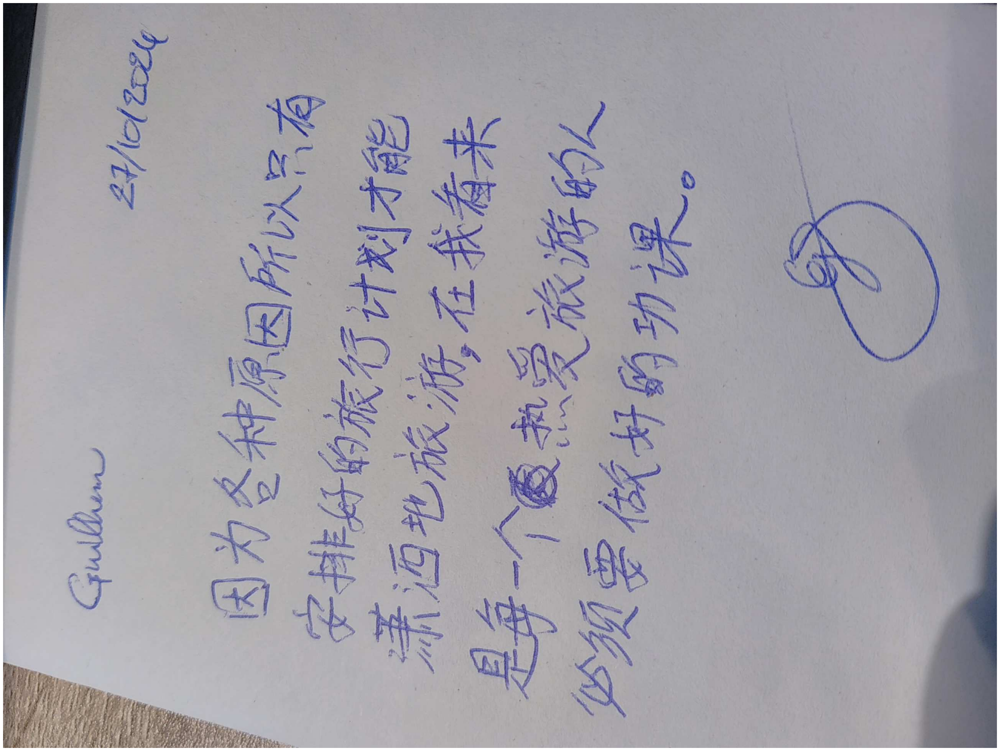

angle=-7.053048133850098
Rotate


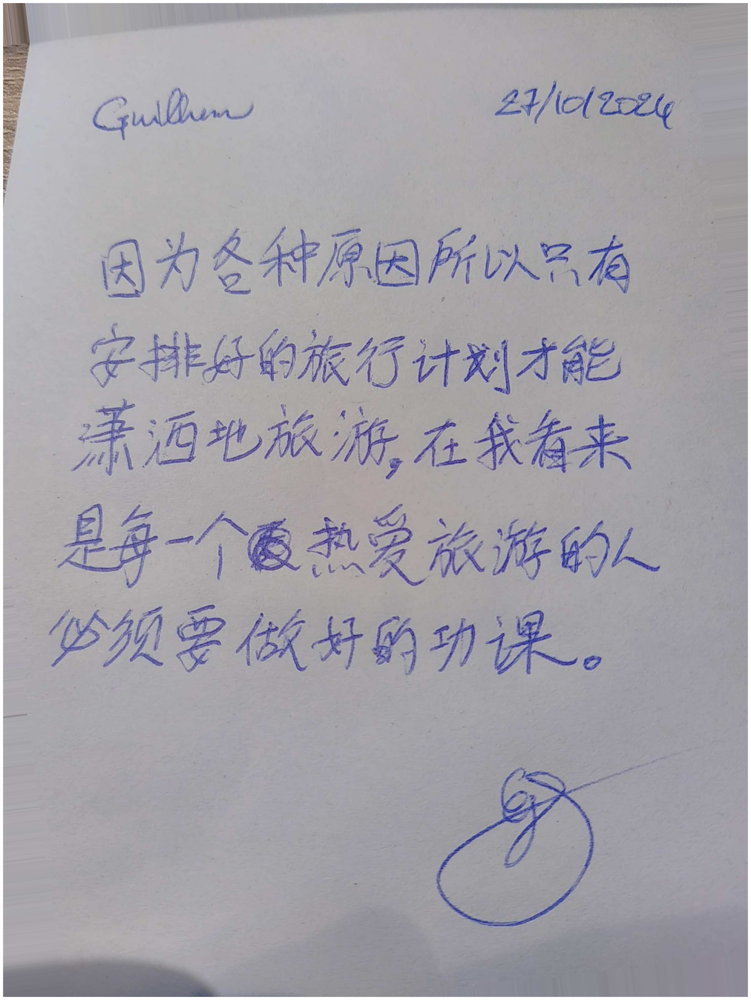

In [3]:
img_repertory = "./Img/*.jpg"

for img_file in glob.glob(img_repertory)[:1]:
    print(img_file)

    display(img_file)
    img = cv2.imread(img_file)

    fixed = deskew(img)
    fixed_file = "./temp/rotated_fixed.jpg"
    cv2.imwrite(fixed_file, fixed)

    display(fixed_file)


### Step 2 : Segmenter ligne par ligne
Il s'agit désormais d'extraire chaque ligne de texte de l'image.

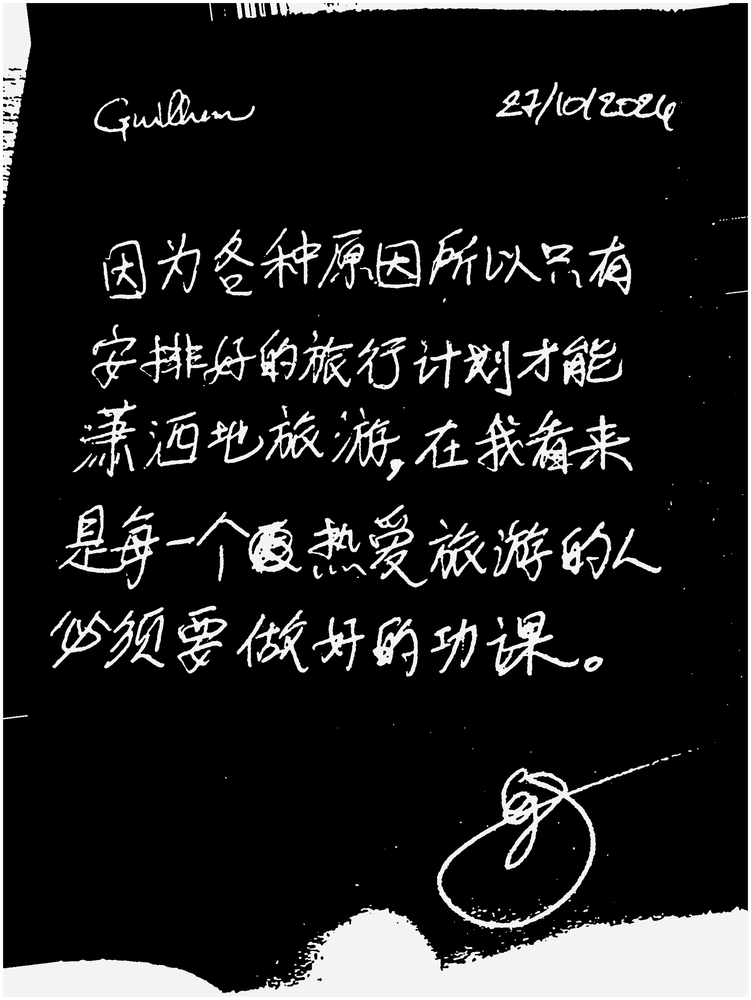

error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/contours_new.cpp:327: error: (-2:Unspecified error) in function 'static std::shared_ptr<ContourScanner_> ContourScanner_::create(cv::Mat, int, int, cv::Point)'
> Modes other than RETR_FLOODFILL and RETR_CCOMP support only CV_8UC1 images (expected: 'img.type() == CV_8UC1'), where
>     'img.type()' is 16 (CV_8UC3)
> must be equal to
>     'CV_8UC1' is 0 (CV_8UC1)


In [12]:
# Fonction pour convertir une image en niveaux de gris
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Fonction pour débruiter l'image
def noise_removal(image):
    import numpy as np
    kernel = np.ones((2, 2), np.uint8)
    image = cv2.dilate(image, kernel, iterations=2)
    kernel = np.ones((2, 2), np.uint8)
    image = cv2.erode(image, kernel, iterations=2)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 5)
    return (image)

fixed_file = "./temp/rotated_fixed.jpg"
image = cv2.imread(fixed_file)

# Convertir en niveaux de gris
img_gray = grayscale(image)
gray_file = "./temp/gray.jpg" 
cv2.imwrite(gray_file, img_gray) # Sauvegarder
#display(gray_file) # Afficher

# Appliquer un seuillage pour créer un masque binaire
threshold_lower = 150
threshold_upper = 200
thresh, mask = cv2.threshold(img_gray, threshold_lower, threshold_upper, cv2.THRESH_BINARY_INV) 
mask_file = "./temp/mask.jpg" 
cv2.imwrite(mask_file, mask) # Sauvegarder
#display(mask_file) # Afficher

# Appliquer le filtre de réduction de bruit
no_noise = noise_removal(mask)
no_noise_file = "./temp/no_noise.jpg"
cv2.imwrite(no_noise_file, no_noise) # Sauvegarder
display(no_noise_file) # Afficher

newImage = image.copy()
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
dilate = cv2.dilate(thresh, kernel, iterations=2)

# Find all contours
contours, hierarchy = cv2.findContours(image, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key = cv2.contourArea, reverse = True)
for c in contours:
    rect = cv2.boundingRect(c)
    x,y,w,h = rect
    cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

# Find largest contour and surround in min area box
largestContour = contours[0]
minAreaRect = cv2.minAreaRect(largestContour)
cv2.imwrite("temp/split_lines.jpg", newImage)
# Determine the angle. Convert it to the 










###
""" 
img_orig = cv2.imread(fixed_file) # image dans le bonne axe
img_thr = cv2.imread(no_noise_file) # image binaire avec réduction de bruitage
h, w, _ = img_thr.shape
img_thr = img_thr[:,:,0]

lines = cv2.HoughLines(img_thr, 1, np.pi / 180, threshold=800)
img_copy = img_orig.copy()
points = []
for rho,theta in lines[:, 0]:
    a, b = np.cos(theta), np.sin(theta)
    x0, y0 = a*rho, b*rho
    x1, x2 = 0, w
    y1 = y0 + a*((0-x0) / -b)
    y2 = y0 + a*((w-x0) / -b)
    cv2.line(img_copy,(int(x1),int(y1)),(int(x2),int(y2)),(255,0,0),4)
    points.append([[x1, y1], [x2, y2]])
points = np.array(points)

print(points) 
"""
###
""" # Créer un noyau horizontal et dilater pour connecter les caractères du texte
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 3))
dilate = cv2.dilate(no_noise, kernel, iterations=1)

# Sauvegarder et afficher l'image dilatée
dilate_file = "./temp/dilate.jpg"
cv2.imwrite(dilate_file, dilate) # Sauvegarder
display(dilate_file) # Afficher

# Trouver les contours et filtrer en utilisant le rapport d'aspect
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    ar = w / float(h)
    if ar < 5:
        cv2.drawContours(dilate, [c], -1, (0,0,0), -1)

# Image résultante après l'opération de bitwise AND
result = 255 - cv2.bitwise_and(dilate, mask)
result_file = "./temp/result.jpg"
cv2.imwrite(result_file, result)
display(result_file)

data = pytesseract.image_to_string(result, lang='chi_sim',config='--psm 6')
print(data)

cv2.waitKey() """

In [5]:
import cv2
import numpy as np

def nothing(x):
    pass

fixed_file = "./temp/rotated_fixed.jpg"

# Charger l'image en niveaux de gris
image = cv2.imread(fixed_file, cv2.IMREAD_GRAYSCALE)

# Créer une fenêtre
cv2.namedWindow('image')

# Créer des trackbars pour le seuil de niveaux de gris
cv2.createTrackbar('Min', 'image', 0, 255, nothing)
cv2.createTrackbar('Max', 'image', 0, 255, nothing)

# Valeurs par défaut pour le seuil max
cv2.setTrackbarPos('Max', 'image', 255)

# Initialiser les valeurs min/max
minVal = maxVal = 0
prevMinVal = prevMaxVal = 0

while True:
    # Récupérer les positions des trackbars
    minVal = cv2.getTrackbarPos('Min', 'image')
    maxVal = cv2.getTrackbarPos('Max', 'image')

    # Appliquer le seuil pour les niveaux de gris
    mask = cv2.inRange(image, minVal, maxVal)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Afficher les valeurs de seuil si elles changent
    if (prevMinVal != minVal) or (prevMaxVal != maxVal):
        print(f"(Min = {minVal}, Max = {maxVal})")
        prevMinVal = minVal
        prevMaxVal = maxVal

    # Afficher l'image résultante
    cv2.imshow('image', result)
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

cv2.destroyAllWindows()

(Min = 0, Max = 255)


In [6]:
image = cv2.imread('./temp/rotated_fixed.jpg')
orig = image.copy()
(H, W) = image.shape[:2]

# set the new width and height and then determine the ratio in change
# for both the width and height
(newW, newH) = (320, 320)
rW = W / float(newW)
rH = H / float(newH)

# resize the image and grab the new image dimensions
image = cv2.resize(image, (newW, newH))
(H, W) = image.shape[:2]

# define the two output layer names for the EAST detector model that
# we are interested -- the first is the output probabilities and the
# second can be used to derive the bounding box coordinates of text
layerNames = [
    "feature_fusion/Conv_7/Sigmoid",
    "feature_fusion/concat_3"]

# load the pre-trained EAST text detector
print("[INFO] loading EAST text detector...")
net = cv2.dnn.readNet('path_containing_frozen_east_text_detection.pb')

# construct a blob from the image and then perform a forward pass of
# the model to obtain the two output layer sets
blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),(123.68, 116.78, 103.94), swapRB=True, crop=False)
net.setInput(blob)
(scores, geometry) = net.forward(layerNames)

# grab the number of rows and columns from the scores volume, then
# initialize our set of bounding box rectangles and corresponding
# confidence scores
(numRows, numCols) = scores.shape[2:4]
rects = []
confidences = []

# loop over the number of rows
for y in range(0, numRows):
    # extract the scores (probabilities), followed by the geometrical
    # data used to derive potential bounding box coordinates that
    # surround text
    scoresData = scores[0, 0, y]
    xData0 = geometry[0, 0, y]
    xData1 = geometry[0, 1, y]
    xData2 = geometry[0, 2, y]
    xData3 = geometry[0, 3, y]
    anglesData = geometry[0, 4, y]
    
    for x in range(0, numCols):
        # ignore probability values below 0.75
        if scoresData[x] < 0.75:
            continue
        
        # compute the offset factor as our resulting feature maps will
        # be 4x smaller than the input image
        (offsetX, offsetY) = (x * 4.0, y * 4.0)
        
        # extract the rotation angle for the prediction and then
        # compute the sin and cosine
        angle = anglesData[x]
        cos = np.cos(angle)
        sin = np.sin(angle)
        
        # use the geometry volume to derive the width and height of
        # the bounding box
        h = xData0[x] + xData2[x]
        w = xData1[x] + xData3[x]
        
        # compute both the starting and ending (x, y)-coordinates for
        # the text prediction bounding box
        endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
        endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
        startX = int(endX - w)
        startY = int(endY - h)
        
        # add the bounding box coordinates and probability score to
        # our respective lists
        rects.append((startX, startY, endX, endY))
        confidences.append(scoresData[x])

# apply non-maxima suppression to suppress weak, overlapping bounding
# boxes
boxes = non_max_suppression(np.array(rects), probs=confidences)

# loop over the bounding boxes
for (startX, startY, endX, endY) in boxes:
    # scale the bounding box coordinates based on the respective
    # ratios
    startX = int(startX * rW)
    startY = int(startY * rH)
    endX = int(endX * rW)
    endY = int(endY * rH)
    # draw the bounding box on the image
    cv2.rectangle(orig, (startX, startY), (endX, endY), (0, 255, 0), 2)

cv2.imwrite('./temp/result.jpg', orig)

[INFO] loading EAST text detector...


error: OpenCV(4.10.0) /io/opencv/modules/dnn/src/caffe/caffe_io.cpp:1138: error: (-2:Unspecified error) FAILED: fs.is_open(). Can't open "path_containing_frozen_east_text_detection.pb" in function 'ReadProtoFromBinaryFile'
